# Rubiks Cube Image Compression
Compute the principal components of image-pixels

In [36]:
import numpy as np
from scipy import linalg
from PIL import Image
import matplotlib.pyplot as plt

In [37]:
im1 = Image.open('rubiks1.jpg').convert('L')
im2 = Image.open('rubiks2.jpg').convert('L')
img_size = im2.size
img_size

(5312, 2988)

### Convert images to array & show image mean picture

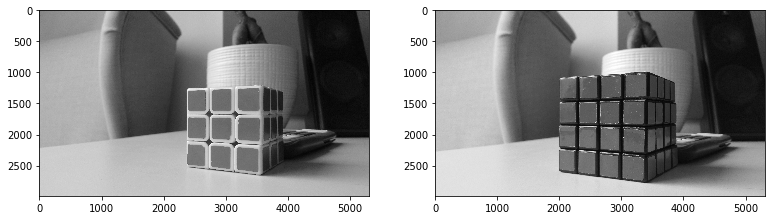

In [54]:
im1_arr = np.array(im1).reshape(1, -1)
im2_arr = np.array(im2).reshape(1, -1)

plt.figure(figsize=(13, 15))
plt.subplot(121)
plt.imshow(np.array(im1), cmap='gray')
plt.subplot(122)
plt.imshow(np.array(im2), cmap='gray')

In [61]:
im_mean_arr = (im1_arr + im2_arr) / 1
im_mean_arr = im_mean_arr.reshape(img_size[1], img_size[0]).astype('uint8')

In [62]:
im_mean = Image.fromarray(im_mean_arr)

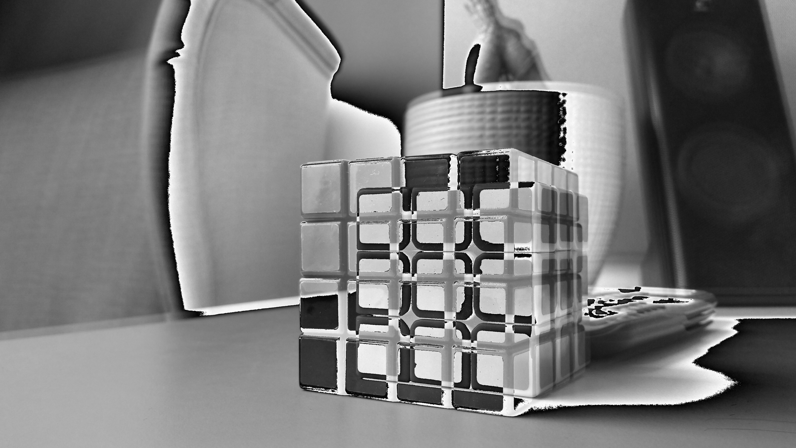

In [63]:
im_mean.thumbnail((im_mean.size[0] * 0.15, im_mean.size[1] * 0.15))
im_mean

### Compute Covariance-Matrix of pixels in both pictures

In [10]:
img_matrix = np.array([im1_arr[0], im2_arr[0]], dtype='float64')
print(img_matrix.shape)
img_matrix

(2, 15872256)


array([[128., 130., 133., ..., 183., 182., 184.],
       [151., 149., 151., ..., 198., 196., 197.]])

In [11]:
# Compute mean-deviation form
img_mat_mean = np.mean(img_matrix, axis=1).reshape(-1, 1)
img_matrix -= img_mat_mean
img_mat_mean

array([[122.4733644 ],
       [119.25061642]])

In [12]:
img_matrix = img_matrix.astype('int16')

In [13]:
img_matrix

array([[ 5,  7, 10, ..., 60, 59, 61],
       [31, 29, 31, ..., 78, 76, 77]], dtype=int16)

In [14]:
# Compute Covariance-Matrix
im_mat_cov = (img_matrix @ img_matrix.T) / (img_matrix.shape[1])
im_mat_cov

array([[ 0.00029599,  0.00086446],
       [ 0.00086446, -0.00027595]])

In [15]:
eig_val, PC = np.linalg.eig(im_mat_cov)

In [16]:
PC

array([[ 0.81057637, -0.58563294],
       [ 0.58563294,  0.81057637]])

In [74]:
PC_img_arr = PC @ img_matrix

# multiply by 1.45 to emphasize lighter regions
PC1_img = Image.fromarray(PC_img_arr[0].reshape(img_size[1], img_size[0]) * 1.45)
PC2_img = Image.fromarray(PC_img_arr[1].reshape(img_size[1], img_size[0]) * 1.45)

PC1_img.size

(5312, 2988)

## First and second principal components of the images

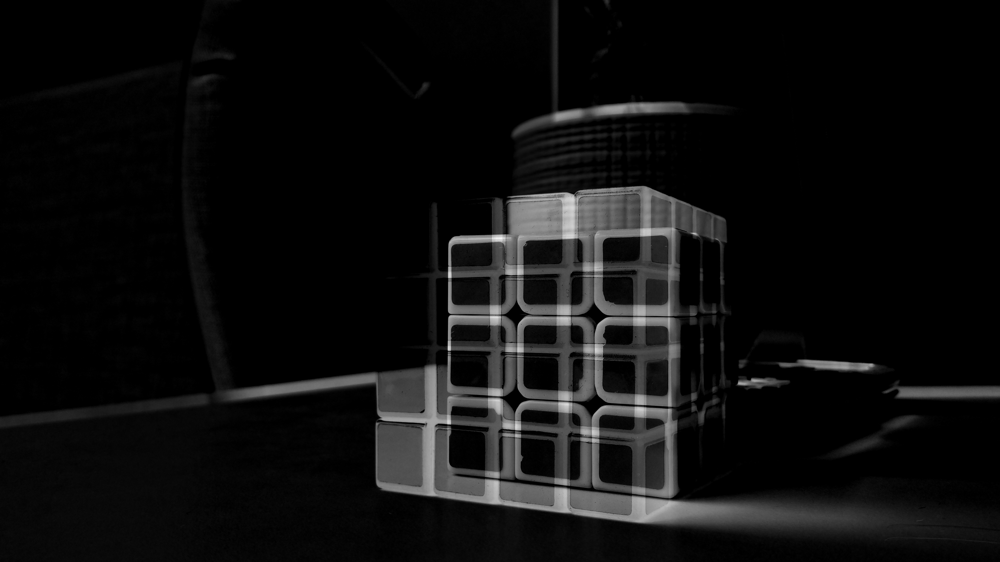

In [75]:
PC1_img.convert('RGB')

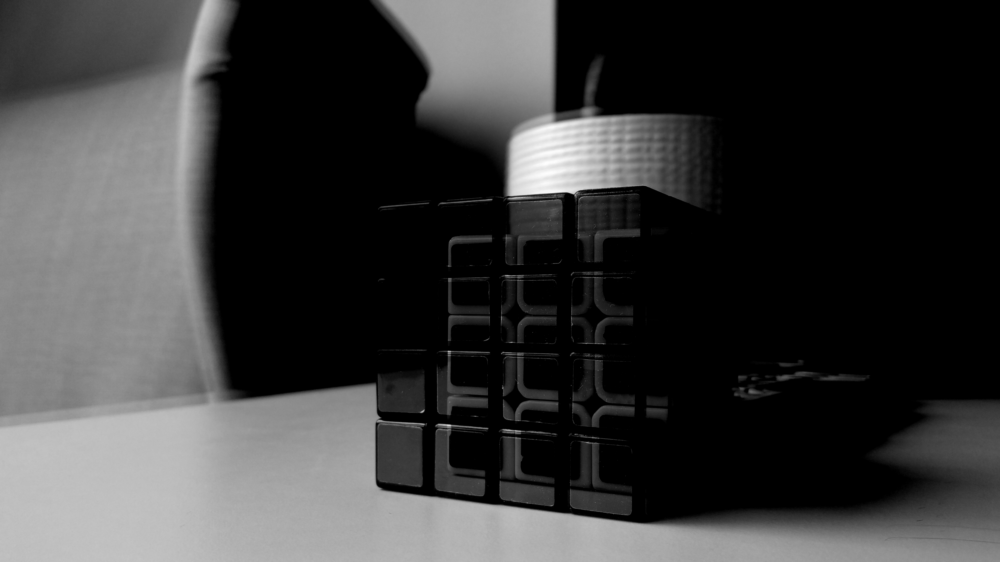

In [76]:
PC2_img.convert('RGB')